# Example


This code shows how to implement a simple physarum-simulation in python, using my `physarum`-package.  The package is heavily inspired by/derivative of work by [**Sage Jenson**](https://sagejenson.com/physarum) and [**Jason Rampe**](https://softologyblog.wordpress.com/2019/04/11/physarum-simulations/), and geared towards the production of digital art and playful experimentation. Have fun!

## Installation

You should be able to install the package with a simple:
`pip install physarum`


## Usage
We start by importing the `physarum`-package.

In [1]:
%load_ext autoreload
%autoreload 2
import physarum



In [2]:
# # standards:
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns

# # image utils:
# from PIL import Image as IMG
# from IPython.display import Image 
# from skimage import data, color
# from skimage.transform import rescale, resize, downscale_local_mean
# import cv2 # for rescaling

# # for the blurring:
# from scipy.ndimage.filters import gaussian_filter, uniform_filter

# # to monitor progress:
# import tqdm

# # to save movies:
# import imageio
# from datetime import datetime

# # for colormaps
# import palettable
# import cmocean 
# from colorsys import hls_to_rgb
# from matplotlib import cm
# from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# # to speed up computation
# import numba

# # noise for the starting-positions:
# import noise
# from scipy import interpolate

## Setting up the colormaps
Before we run our simulation, we have to set up the colormaps that we want to use for each of our physarum-populations. I like to use the little function below that allows me to produce colormaps from a list of `[hue,chroma,luminosity]`-triples, but in principle you can just use any matplotlib-colormap.

The first colormap can be fully opaque, but the other two will be overlayed, so the will need some transparancy given by the ` alpha-distribution`-parameter in the form `[alpha with which to start, percentage at which to start, alpha with which to end, percentage at which to end]`. The current examples leave the bottom 10% of the colormap fully transparent, the top 20% at 90% transparency, with a regular increase in between.

The function also automatically plots your colormap. With the basecolor-parameter, you can set the background of this plot.



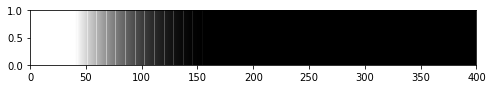

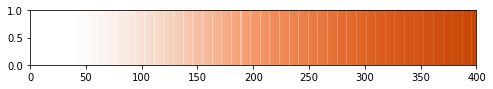

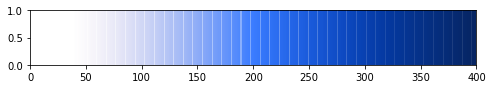

In [257]:
### # make_colormap([[0,90,50],[50,90,50],[100,90,50],[150,90,50],[200,90,50],[250,90,50],[300,90,50],[350,90,50]],alpha=False)
species_a_color = physarum.make_colormap([[120,70,0],[120,80,0]],alpha_distribution=[0.0,0.1,1.,0.4])
species_b_color = physarum.make_colormap([[2,10,90],[20,90,60],[20,95,40]],alpha_distribution=[0.01,0.1,0.9,0.8], basecolor= species_a_color(0))
species_c_color = physarum.make_colormap([[2,100,90],[220,100,50],[220,90,20]],alpha_distribution=[0.01,0.1,0.9,0.8], basecolor= species_a_color(0))



## Setting up basic parameters

We set up the basic parameters for our simulation: width, height (in px) and the amount of itererations for which we want it to run. 

In [4]:
width = 1500
height = 1500
t = 1000 

## Setting up the initial positions



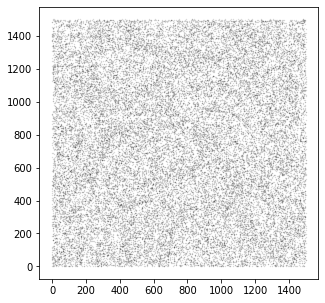

In [111]:
init=[physarum.get_image_init_positions("../../seed/paisley.jpg",shape=(height, width),n=100000,flip=False,channel = 'G')]


# plot the init with matplotlib (not necessary, only for illustration):
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(5,5))
init_to_plot = np.vstack([i[0] for i in init]),np.vstack([i[1] for i in init])
init_to_plot = np.hstack(init_to_plot)

plt.scatter(init_to_plot[:,0],init_to_plot[:,1],s=0.1, c='black',alpha=0.2)

[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 ...
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]
Feeding Pattern:


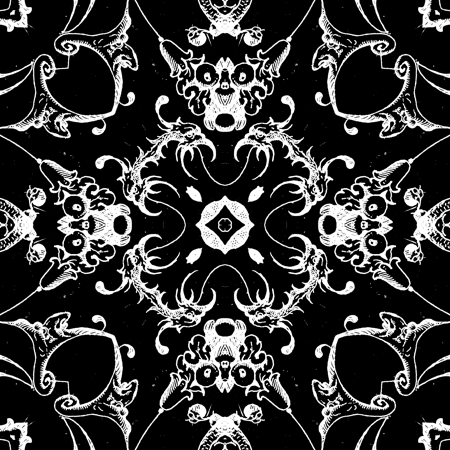

In [256]:
# feeding_trace = physarum.leave_feeding_trace(feed_pattern[:,0],feed_pattern[:,1], shape=(width,height), trace_strength=10, sigma=3,mode='wrap',truncate=40)
feeding_trace = physarum.get_image_init_array('../../seed/grot2.png',shape = (width,height))
# feeding_trace =  (1-physarum.get_image_init_array('seed/maze.png',shape = (width,height)) *100000 -100000) + 100000*feeding_trace  

print(feeding_trace)
print('Feeding Pattern:')
physarum.plot_init_trace(feeding_trace,cmap=species_a_color)

In [268]:
species_a = physarum.physarum_population(height=height,width=width,t=t,
                                horizon_walk=1,horizon_sense=17,
                                theta_walk=12,theta_sense=15.,walk_range =[0.5,1.1],
                                colormap=species_a_color,
                                social_behaviour =-10,trace_strength = 1,
                                initialization=[physarum.get_circle_init(n=1000000, center=(750,750),radius=30,width=3),
                                                #physarum.get_perlin_init(shape=(width,height), n=100000,scale=250) ,
#                                                 physarum.get_gaussian_gradient(n=1000000, center=(750,750),sigma=10)
                                               ],
                                template=feeding_trace,template_strength=150)


species_b = physarum.physarum_population(height=height,width=width,t=t,
                                horizon_walk=[4,2],horizon_sense=6,
                                theta_walk=15,theta_sense=10.,walk_range = [0.9,1.2],
                                colormap=species_b_color,
                                social_behaviour = -10,trace_strength = 1,
                                initialization=[physarum.get_image_init_positions("../../seed/grot1.png",shape=(height, width),n=400000,flip=False,channel = 'G')],
                                         template=feeding_trace,template_strength=-2)

species_c = physarum.physarum_population(height=height,width=width,t=t,
                                horizon_walk=4,horizon_sense=6,
                                theta_walk=15,theta_sense=10.,walk_range = [1.,4],
                                colormap=species_c_color,
                                social_behaviour =-16,trace_strength = 1,
                                initialization=[physarum.get_image_init_positions("../../seed/grot1.png",shape=(height, width),n=400000,flip=True,channel = 'B')])



C:\Users\noich\anaconda3\lib\site-packages\physarum\__init__.py:140: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if template == "None":  # hmm?
C:\Users\noich\anaconda3\lib\site-packages\physarum\__init__.py:140: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if template == "None":  # hmm?


In [269]:
# !black physarum.py
# !pip install -U Sphinx
help(physarum.run_physarum_simulation)

Help on function run_physarum_simulation in module physarum:

run_physarum_simulation(populations, image_list, additive_trace=True, diffusion='uniform', mask=False, cmap_rescaling=['cutoff90', 'sqrt', 'normalize'], decay=0.9, show_image_every=20, img_rescale=0.2, show='trace')



Step No.: 0


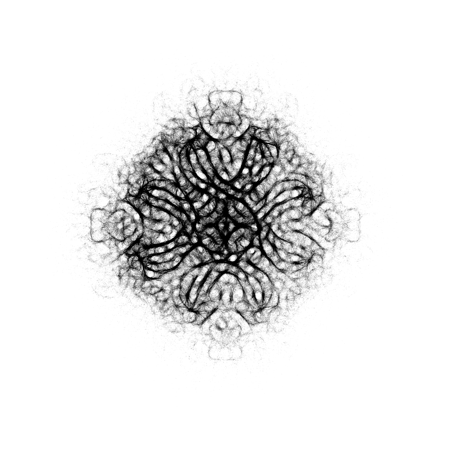

Step No.: 20


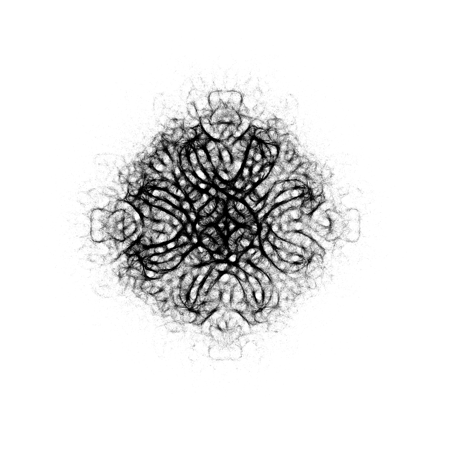

Step No.: 40


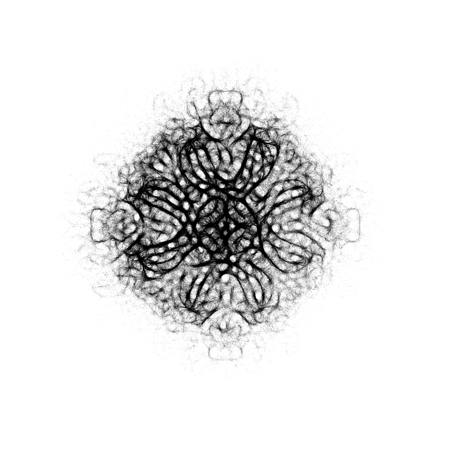

Step No.: 60


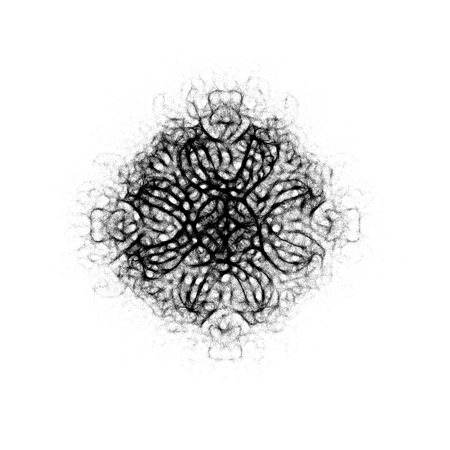

Step No.: 80


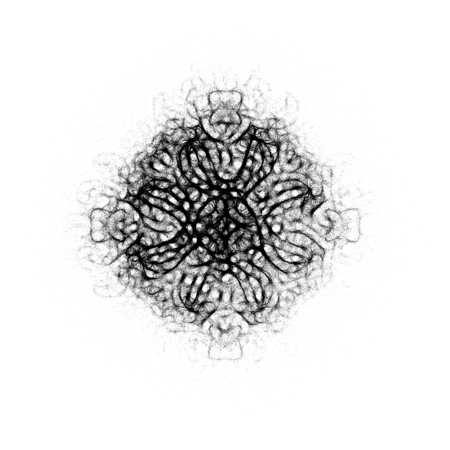

Step No.: 100


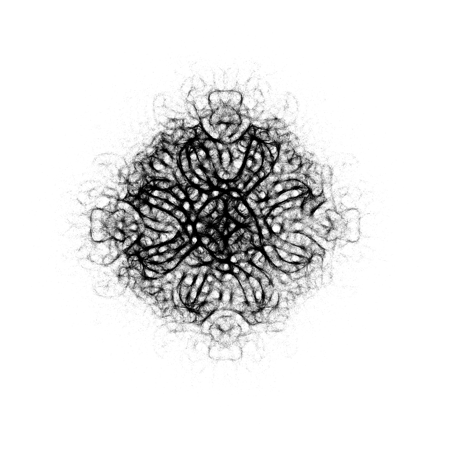

Step No.: 120


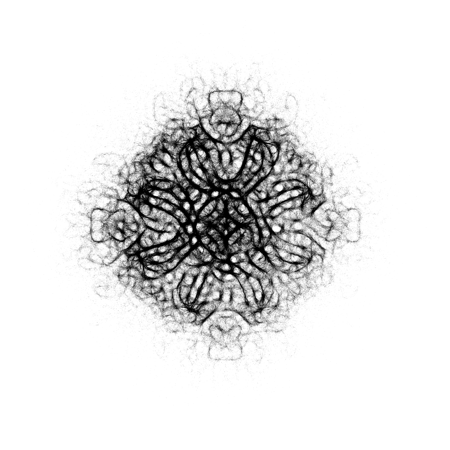

Step No.: 140


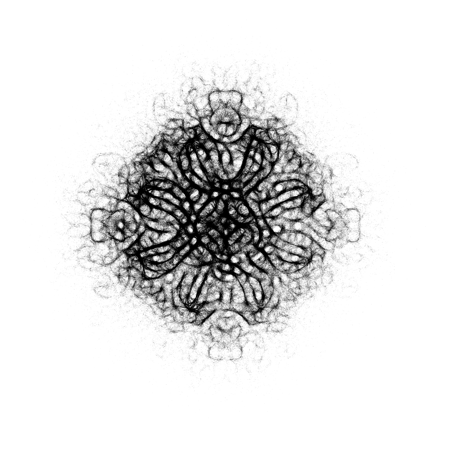

Step No.: 160


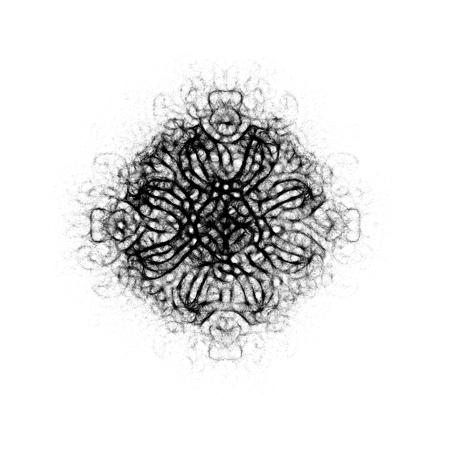

Step No.: 180


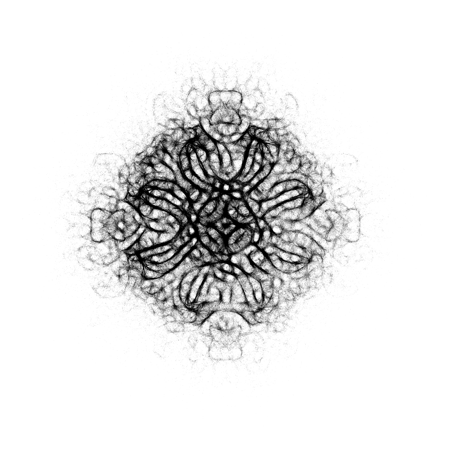

Step No.: 200


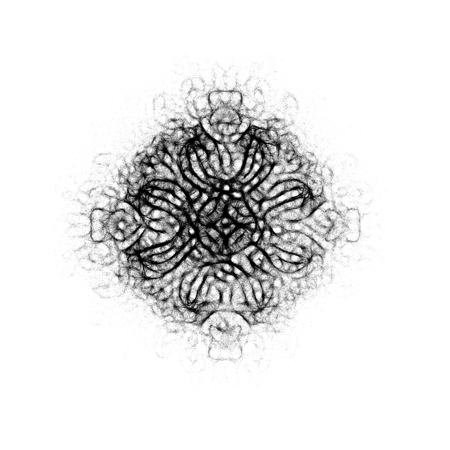

Step No.: 220


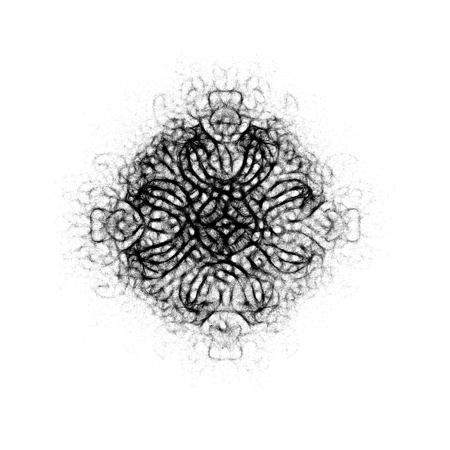

Step No.: 240


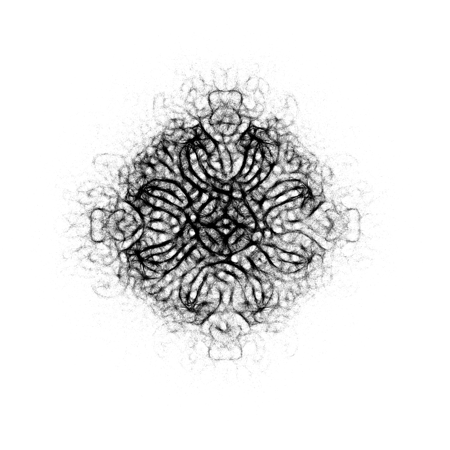

Step No.: 260


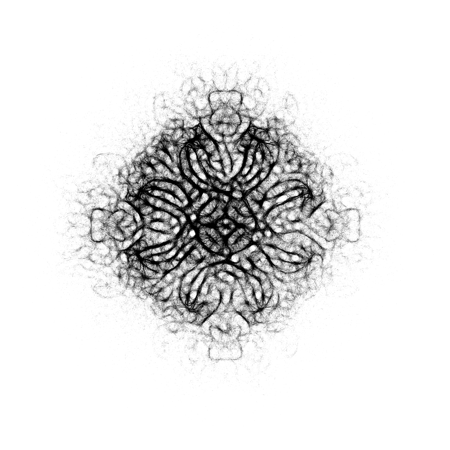

Step No.: 280


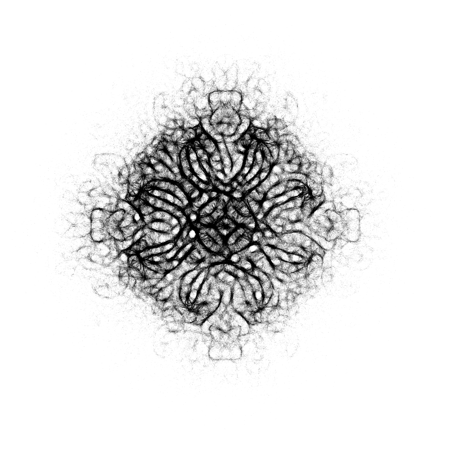

Step No.: 300


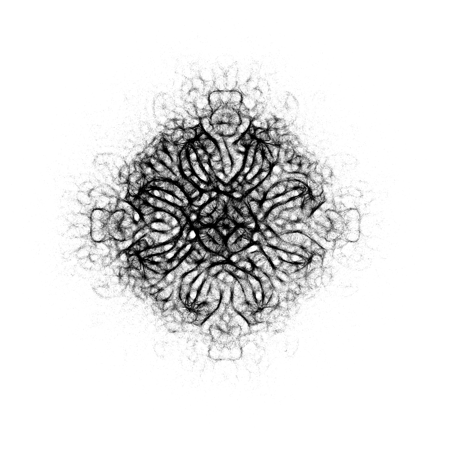

Step No.: 320


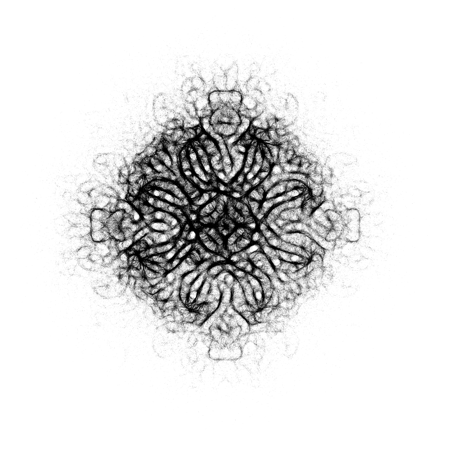

Step No.: 340


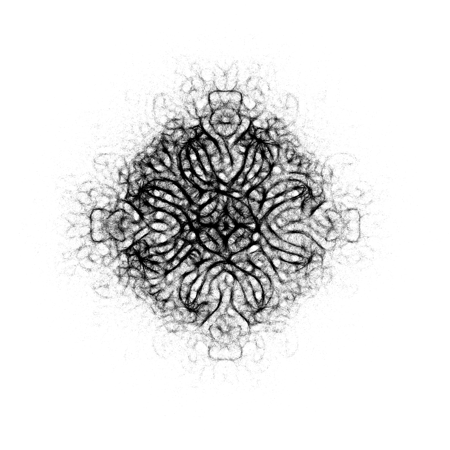

Step No.: 360


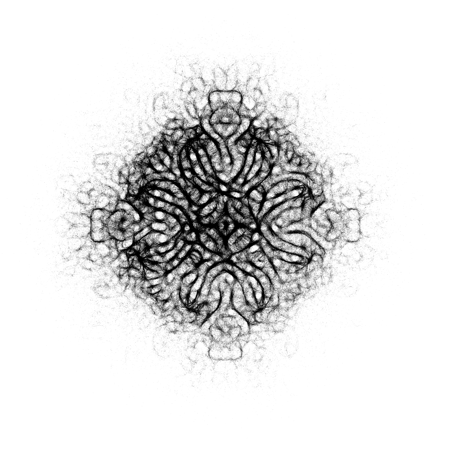

Step No.: 380


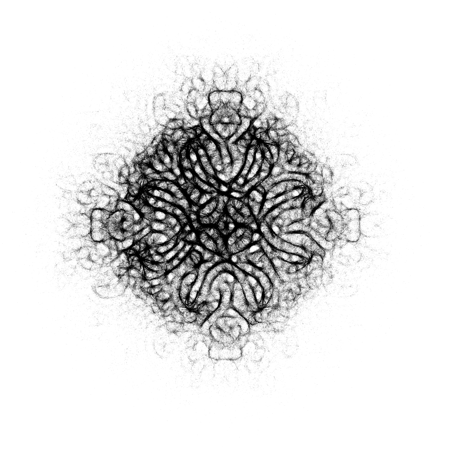

Step No.: 400


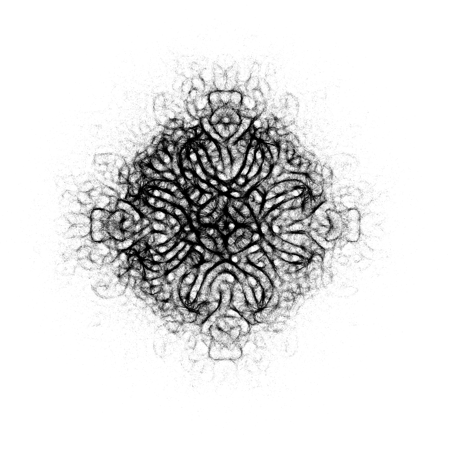

Step No.: 420


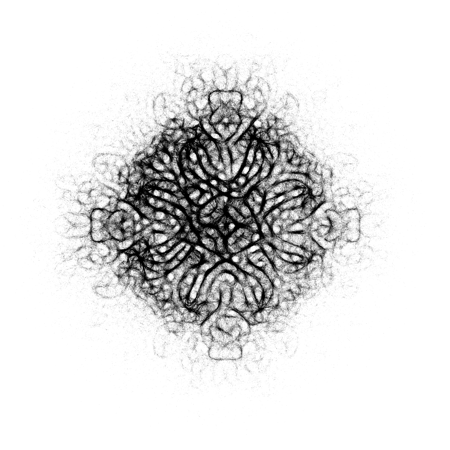

Step No.: 440


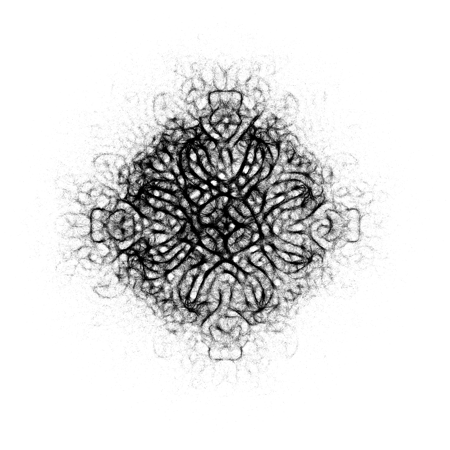

Step No.: 460


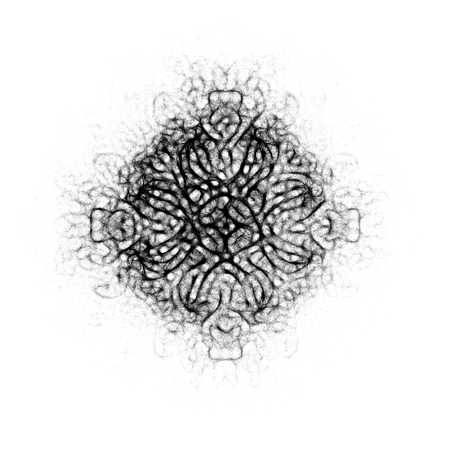

Step No.: 480


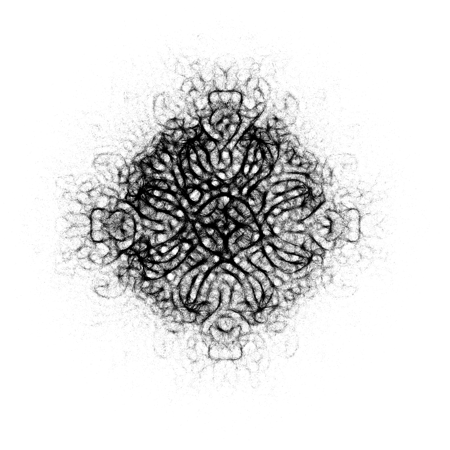

Step No.: 500


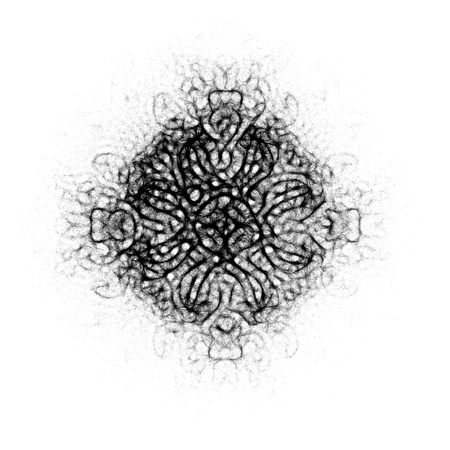

Step No.: 520


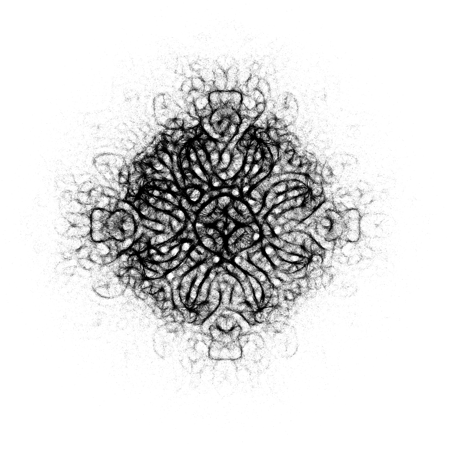

Step No.: 540


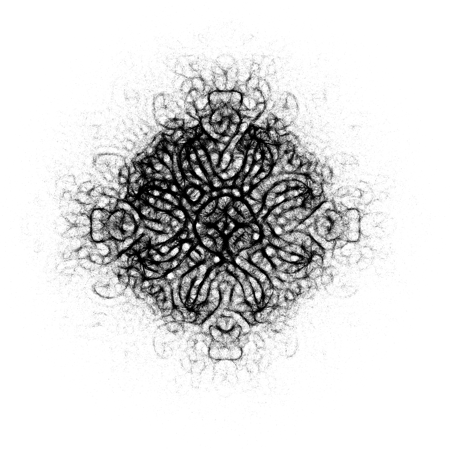

Step No.: 560


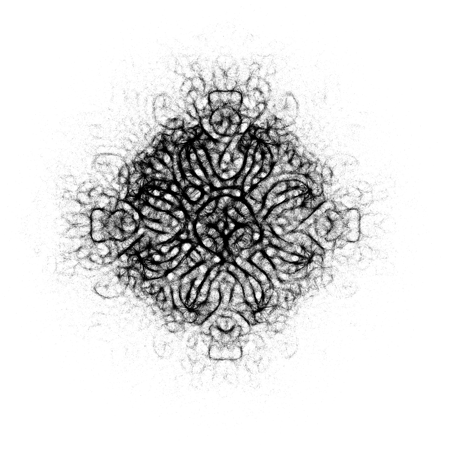

Step No.: 580


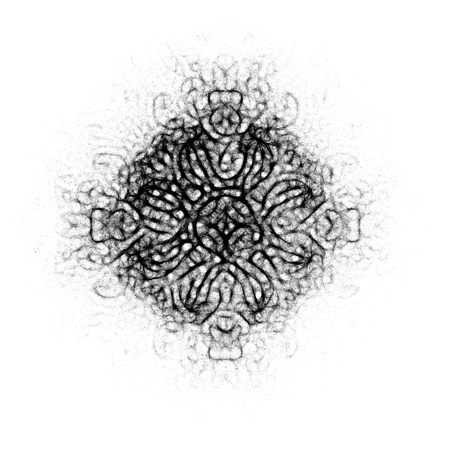

Step No.: 600


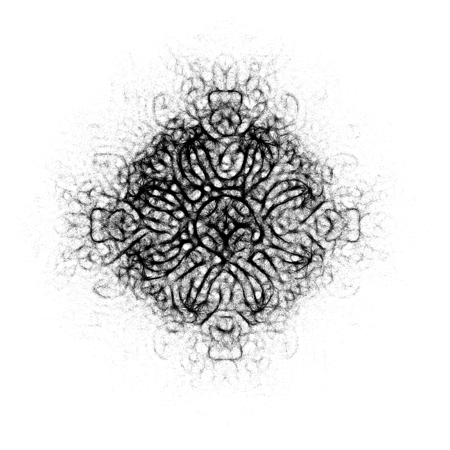

Step No.: 620


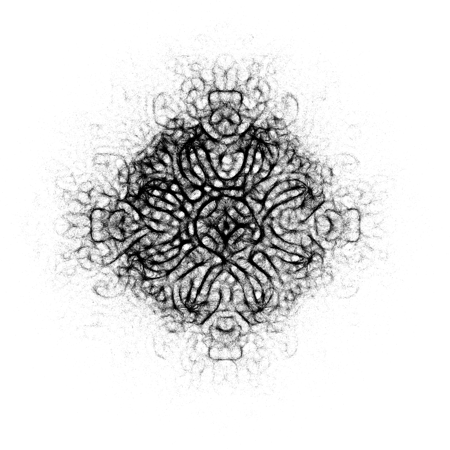

Step No.: 640


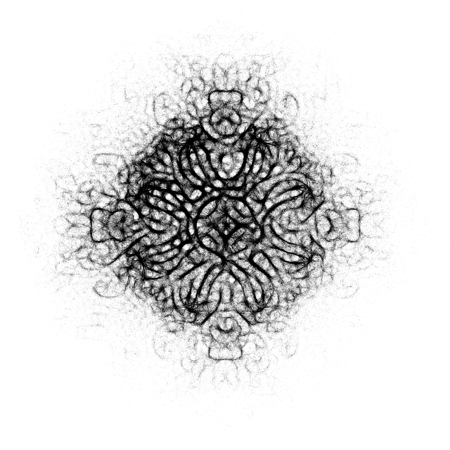

In [ ]:

species_list = [species_a]#,species_b]#,species_c]
images=[]
physarum.run_physarum_simulation(populations = species_list, diffusion = "none", cmap_rescaling=['cutoff90', 'sqrt', 'normalize'],
                                 image_list=images, img_rescale=0.3, decay=.7)#,show = 'position')

In [171]:
# images

# save favorite moments, (This should be of a 'frames to include-kind' )

physarum.save_film(images)


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1500, 1500) to (1504, 1504) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


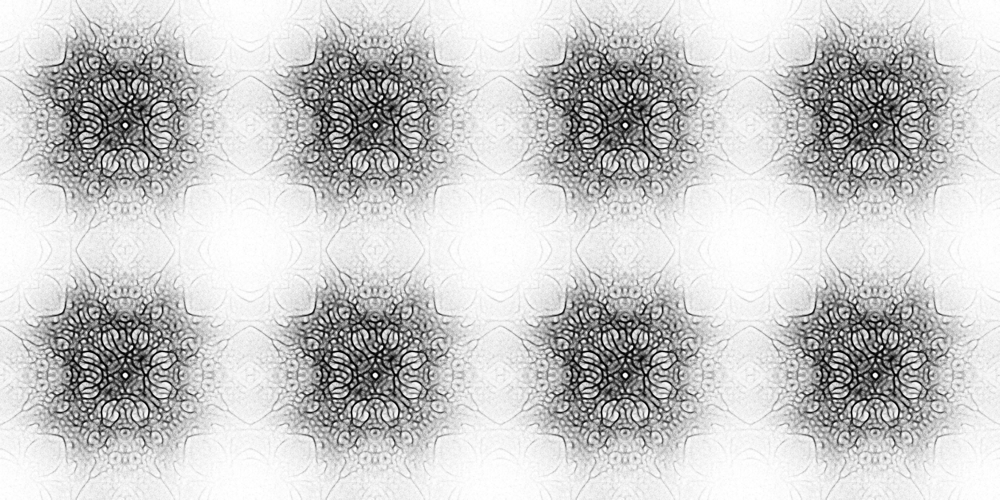

FileNotFoundError: [Errno 2] No such file or directory: 'physarum_tiles/12-14-2020--04-48-10.png'

In [241]:
# physarum.save_grid(images, folder='physarum_tiles/')
physarum.save_single_image_grid(images,image_no=330,dimensions=(4,2))

### Saving of our film
We write the list of PIL-images we have created, either as a mp4 or as a gif. I like to give each file an automated time-stamp name, so I don't have to write something new while experimenting.

In [13]:
# create image-bar:
n = 5
images_to_use = [np.floor(x) for x in np.linspace(15,len(images)-15,n)]


images_to_use = [np.array(images[int(s)]) for s in images_to_use]
print(images_to_use[0].shape)
# make borders:
borders = [np.zeros((images_to_use[0].shape[0],5,4)).astype(int)] * (n-1)
result = [None]*(len(borders)+len(images_to_use))
result[::2] = images_to_use
result[1::2] = borders
# im = np.uint8(im * 255)

tile_array = np.hstack(result)
image_collection = IMG.fromarray(np.uint8(tile_array))
display(image_collection)

now = datetime.now() # current date and time
date_time = now.strftime("%m-%d-%Y--%H-%M-%S")
image_collection.save("physarum_tiles/"+date_time+".png")

IndexError: list index out of range

In [7]:
a = 1 - physarum.get_image_init_array('seed/maze.png',shape = (width,height))
mask = np.where(a>0.5, 1.0, 0.0).astype(bool)
mask

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [5]:
feed_list=[[0,0],
#     get_circle_init(n=20000, center=(1100,500),radius=200,width=30),
#            get_circle_init(n=20000, center=(750,750),radius=200,width=30),
#            get_filled_circle_init(n=20000, center=(700,350),radius=10),
#             get_filled_circle_init(n=20000, center=(550,700),radius=200),
#    physarum.get_gaussian_gradient(n=100000, center=(750,750),sigma=300),
# physarum.get_gaussian_gradient(n=100000, center=(500,999),sigma=100),

 #          physarum.get_circle_init(n=100000, center=(750,750),radius=200,width=30),
        physarum.get_perlin_init(shape=(width,height), n=100000,scale=250) 
#            get_circle_init(n=200000, center=(1000,1000),radius=150,width=100)
#     get_image_init('seed/johnson_overlay.png',shape = (width,height),n=20000)
          ]

# feed_list = feed_list + [get_filled_circle_init(n=20000, center=(np.random.randint(width),np.random.randint(height)),radius=np.random.randint(30,high=60)) for x in range(0,80)] 
feed_pattern = np.vstack([i[0] for i in feed_list]),np.vstack([i[1] for i in feed_list])
feed_pattern = np.hstack(feed_pattern)